In [3]:

from PIL import Image
from pathlib import Path
from sklearn.manifold import TSNE
import pickle
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
import pandas as pd
from collections import defaultdict
import plotly.graph_objects as go


In [31]:
vindr_embeddings_path = Path('/vol/biomedic3/bglocker/ugproj2324/nns20/CheXagent/model_inspection/embeddings/VinDr_test_paired')
files = [f for f in vindr_embeddings_path.iterdir() if f.is_file()]
print(files)

[PosixPath('/vol/biomedic3/bglocker/ugproj2324/nns20/CheXagent/model_inspection/embeddings/VinDr_test_paired/embeddings_batch_3.pkl'), PosixPath('/vol/biomedic3/bglocker/ugproj2324/nns20/CheXagent/model_inspection/embeddings/VinDr_test_paired/embeddings_batch_4.pkl'), PosixPath('/vol/biomedic3/bglocker/ugproj2324/nns20/CheXagent/model_inspection/embeddings/VinDr_test_paired/embeddings_batch_10.pkl'), PosixPath('/vol/biomedic3/bglocker/ugproj2324/nns20/CheXagent/model_inspection/embeddings/VinDr_test_paired/embeddings_batch_17.pkl'), PosixPath('/vol/biomedic3/bglocker/ugproj2324/nns20/CheXagent/model_inspection/embeddings/VinDr_test_paired/embeddings_batch_19.pkl'), PosixPath('/vol/biomedic3/bglocker/ugproj2324/nns20/CheXagent/model_inspection/embeddings/VinDr_test_paired/embeddings_batch_22.pkl'), PosixPath('/vol/biomedic3/bglocker/ugproj2324/nns20/CheXagent/model_inspection/embeddings/VinDr_test_paired/embeddings_batch_25.pkl'), PosixPath('/vol/biomedic3/bglocker/ugproj2324/nns20/CheX

In [30]:

# prepare labels for image_ids
with open('/vol/biomedic3/bglocker/ugproj2324/nns20/datasets/VinDr-CXR/image_text_reasoning_datasets/test_all_left_or_right') as f:
    # skip the header
    f.readline()
    lines = f.readlines()
    image_id_to_label_and_location = defaultdict(list)
    # use a set to store the unique labels
    labels = set()
    for line in lines:
        image_id, label, location = line.strip().split(',')
        labels.add(label)
        image_id_to_label_and_location[image_id].append((label, location))




In [27]:
# data frame construction for labels
# Step 1: Create column names
column_names = ["image_id"] + [f"{label}" for label in labels] + [f"{label} position" for label in labels]
# # Initialize default row data template with all False for labels and None for positions
default_row_data = {label: False for label in labels}
default_row_data.update({f"{label} position": "none" for label in labels})

# Step 2: Prepare the rows data
rows_data = []

for image_id, label_locations in image_id_to_label_and_location.items():
    # Initialize row data from the default template
    row_data = default_row_data.copy()
    row_data["image_id"] = image_id
    
    # Update row data based on actual labels and positions
    label_location = {}
    for label, location in label_locations:
        row_data[label] = True                
        if label in label_location:
            label_location[label] = "left and right"
        else:
            label_location[label] = location


    for label in label_location:
        row_data[f"{label} position"] = label_location[label]

    # Append the row data to rows_data list
    rows_data.append(row_data)
    

# # Step 3: Create the DataFrame in one operation
df_labels = pd.DataFrame(rows_data, columns=column_names)

In [33]:
rows = []  # To accumulate rows

for file in files:
    with open(vindr_embeddings_path / file, 'rb') as f:
        data = pickle.load(f)
        for index, (key, value) in enumerate(data.items()):
            row = {
                "image_id": key,
                "patch_embeddings": value["patch_embeddings"],
                "post_layer_norm": value["post_layer_norm"],
                "q_former": value["q_former"],
                "language_projection": value["language_projection"],
            }
            rows.append(row)

# # Create the DataFrame in one operation
df_embeddings = pd.DataFrame(rows, columns=["image_id", "patch_embeddings", "post_layer_norm", "q_former", "language_projection"])

In [34]:
# merge the two dataframes
df = pd.merge(df_embeddings, df_labels, on="image_id")

In [35]:
# store the merged dataframe
stored_df_path = Path('/vol/biomedic3/bglocker/ugproj2324/nns20/CheXagent/model_inspection/embeddings/collated_dataframe.pkl')
with open(stored_df_path, 'wb') as f:
    pickle.dump(df, f)

# # load the merged dataframe
# stored_df_path = Path('/vol/biomedic3/bglocker/ugproj2324/nns20/CheXagent/model_inspection/embeddings/collated_dataframe.pkl')
# with open(stored_df_path, 'rb') as f:
#     df = pickle.load(f)

In [ ]:
# get all the q_former embeddings from the dataframe and store them in a numpy array
q_former_embeddings = df["q_former"].to_numpy() # treats each row as a general python object (not recognised as a numpy array)
q_former_embeddings_stacked = np.stack(q_former_embeddings, axis=0) # np.stack treats each row as a numpy array
q_former_embeddings_flattened = np.reshape(q_former_embeddings_stacked, (q_former_embeddings_stacked.shape[0], -1))


In [ ]:
# t-SNE using left vs right labels
perplexity = np.arange(10, 210, 20)
divergence = []
for p in perplexity:
    tsne = TSNE(n_components=2, perplexity=p, n_iter=300)
    tsne_result = tsne.fit_transform(q_former_embeddings_flattened)
    divergence.append(tsne.kl_divergence_)
    # plt.scatter(tsne_result[:, 0], tsne_result[:, 1])
    # plt.title(f't-SNE of Q_former embeddings with perplexity = {p}')
    # plt.show()

plt.plot(perplexity, divergence)
plt.title('KL divergence vs perplexity')
plt.xlabel('Perplexity')
plt.ylabel('KL divergence')
plt.show()




In [55]:
df.columns

Index(['image_id', 'patch_embeddings', 'post_layer_norm', 'q_former',
       'language_projection', 'Mediastinal shift', 'Consolidation',
       'Lung cyst', 'Cardiomegaly', 'Pleural thickening', 'Lung cavity',
       'Atelectasis', 'Lung Opacity', 'Emphysema', 'Nodule/Mass',
       'Calcification', 'Pneumothorax', 'Aortic enlargement', 'ILD',
       'Infiltration', 'Clavicle fracture', 'Rib fracture', 'No finding',
       'Pulmonary fibrosis', 'Other lesion', 'Pleural effusion', 'Enlarged PA',
       'Mediastinal shift position', 'Consolidation position',
       'Lung cyst position', 'Cardiomegaly position',
       'Pleural thickening position', 'Lung cavity position',
       'Atelectasis position', 'Lung Opacity position', 'Emphysema position',
       'Nodule/Mass position', 'Calcification position',
       'Pneumothorax position', 'Aortic enlargement position', 'ILD position',
       'Infiltration position', 'Clavicle fracture position',
       'Rib fracture position', 'No finding p

In [56]:
pathologies = ['Mediastinal shift', 'Consolidation',
       'Lung cyst', 'Cardiomegaly', 'Pleural thickening', 'Lung cavity',
       'Atelectasis', 'Lung Opacity', 'Emphysema', 'Nodule/Mass',
       'Calcification', 'Pneumothorax', 'Aortic enlargement', 'ILD',
       'Infiltration', 'Clavicle fracture', 'Rib fracture', 'No finding',
       'Pulmonary fibrosis', 'Other lesion', 'Pleural effusion', 'Enlarged PA',]

In [21]:
# Prepare TSNE embeddings (this part remains the same)
tsne_q_former = TSNE(n_components=2, perplexity=170, n_iter=300)
tsne_q_former_result = tsne_q_former.fit_transform(q_former_embeddings_flattened)

In [45]:

# Create Plotly figure with scatter plot
fig = go.Figure(data=go.Scatter(
    x=tsne_q_former_result[:,0], 
    y=tsne_q_former_result[:,1],
    mode='markers',
    marker=dict(color='lightgray')  # Default color
))

# Add dropdown buttons and set up their functionality for interactive plotting
buttons = []

for pathology in pathologies:
    # Determine color for each point based on the pathology presence (True=blue, False=gray)
    colors = ['red' if val else 'lightgray' for val in df[pathology]]
    button = dict(label=pathology,
                  method='update',
                  args=[{'marker': {'color': colors, 'size': 5}}, 
                        {'title': f't-SNE colored by {pathology}'}])
    buttons.append(button)
    
fig.update_layout(
    updatemenus=[
        dict(buttons=buttons,
             direction="down",
             pad={"r": 10, "t": 10},
             showactive=True,
             x=0.1,
             xanchor="left",
             y=1.15,
             yanchor="top")
    ],
    title="t-SNE of Q_former embeddings",
    xaxis=dict(title='t-SNE Dimension 1'),
    yaxis=dict(title='t-SNE Dimension 2')
)

fig.show()

In [63]:
# Selected pathology
selected_pathology = "Pleural thickening"
position_column = selected_pathology + " position"

# Step 1: Filter DataFrame
filtered_df = df[df[selected_pathology] == True]

# Step 2: Extract "q_former" embeddings for filtered samples
embeddings = np.stack(filtered_df['q_former'].to_numpy()).view(np.float32).reshape(filtered_df.shape[0], -1)

# Step 3: Compute t-SNE based on filtered embeddings
tsne = TSNE(n_components=2, random_state=42)
tsne_q_former_result_filtered = tsne.fit_transform(embeddings)

# Step 4: Create Plotly figure with scatter plot for the filtered and computed t-SNE results
fig = go.Figure(
    data=go.Scatter(
        x=tsne_q_former_result_filtered[:, 0], 
        y=tsne_q_former_result_filtered[:, 1],
        mode='markers',
        marker=dict(color=[ 'blue' if position == 'left' else 'red' for position in filtered_df[position_column] ]),
        text=filtered_df['image_id']  # Assuming you may want to show the image_id as hover text
    )
)

# Set up the layout and title to reflect the selected pathology and its position information
fig.update_layout(
    title=f"t-SNE of Q_former embeddings colored by {selected_pathology} position",
    xaxis=dict(title='t-SNE Dimension 1'),
    yaxis=dict(title='t-SNE Dimension 2'),
)

fig.show()

In [47]:

# Prepare TSNE embeddings for 3D
tsne_q_former_three = TSNE(n_components=3, perplexity=170, n_iter=300)
tsne_q_former_result_three = tsne_q_former_three.fit_transform(q_former_embeddings_flattened)


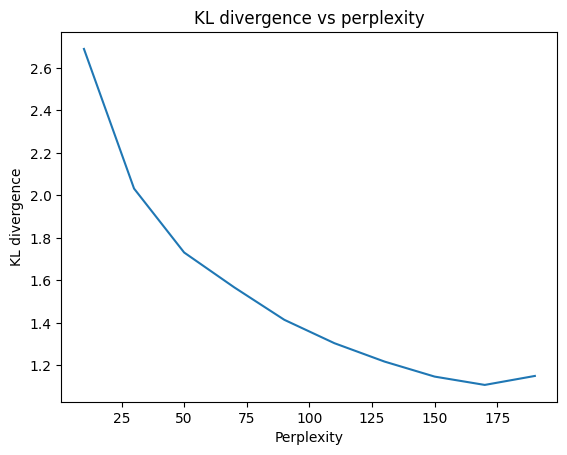

In [51]:
# t-SNE using left vs right labels

perplexity = np.arange(10, 210, 20)
divergence = []
for p in perplexity:
    tsne_three = TSNE(n_components=2, perplexity=p, n_iter=300)
    tsne_result = tsne_three.fit_transform(q_former_embeddings_flattened)
    divergence.append(tsne_three.kl_divergence_)


plt.plot(perplexity, divergence)
plt.title('KL divergence vs perplexity')
plt.xlabel('Perplexity')
plt.ylabel('KL divergence')
plt.show()

In [48]:

# Create Plotly figure with 3D scatter plot
fig = go.Figure(data=go.Scatter3d(
    x=tsne_q_former_result_three[:,0], 
    y=tsne_q_former_result_three[:,1],
    z=tsne_q_former_result_three[:,2],  # Additional Z-axis for 3D
    mode='markers',
    marker=dict(color='lightgray')  # Default color
))

# The setup for the dropdown buttons and their functionality remains the same
buttons = []

for pathology in pathologies:
    # Colors based on pathology presence
    colors = ['green' if val else 'lightgray' for val in df[pathology]]
    button = dict(label=pathology,
                  method='update',
                  args=[{'marker': {'color': colors, 'size': 5}}, 
                        {'title': f't-SNE colored by {pathology}'}])
    buttons.append(button)
    
fig.update_layout(
    updatemenus=[
        dict(buttons=buttons,
             direction="down",
             pad={"r": 10, "t": 10},
             showactive=True,
             x=0.1,
             xanchor="left",
             y=1.15,
             yanchor="top")
    ],
    title="3D t-SNE of Q_former embeddings",
    scene=dict(
        xaxis_title='t-SNE Dimension 1',
        yaxis_title='t-SNE Dimension 2',
        zaxis_title='t-SNE Dimension 3'
    )
)

fig.show()

In [47]:

# Step 1: Specify the pathologies you are interested in
pathologies = ['Mediastinal shift', 'Consolidation', 'Lung cyst', 'Cardiomegaly', 'Pleural thickening', 'Lung cavity',
               'Atelectasis', 'Lung Opacity', 'Emphysema', 'Nodule/Mass', 'Calcification', 'Pneumothorax',
               'Aortic enlargement', 'ILD', 'Infiltration', 'Clavicle fracture', 'Rib fracture', 'No finding',
               'Pulmonary fibrosis', 'Other lesion', 'Pleural effusion', 'Enlarged PA']

# Prepare the figure for interactive visualization
fig = go.Figure()

# Initialize t-SNE
tsne = TSNE(n_components=2, random_state=42)

buttons = []

# Step 2: Loop through each pathology to prepare the buttons for interactivity
for pathology in pathologies:
    pathology_position_col = pathology + ' position'
    
    
    # Step 3: Using the positions to color the embeddings
    # four possible colours, one for left , one for right and one for left and right, gray for none
    colours = ['blue' if position == 'left' else 'red' if position == 'right' else 'light yellow' if position == 'left and right' else 'green' for position in df[pathology_position_col]]
    

    # Setup the button for the current pathology
    button = dict(label=pathology,
                  method='update',
                  args=[{'marker': {'color': colours, 'size': 5}}, 
                        {'title': f'T-SNE visualization of {pathology} by position'}])
    buttons.append(button)

# Add buttons to the figure for interactivity
fig.update_layout(
    updatemenus=[
        dict(buttons=buttons,
             direction="down",
             pad={"r": 10, "t": 10},
             showactive=True,
             x=0.1,
             xanchor="left",
             y=1.15,
             yanchor="top")
    ],
    title="t-SNE visualization by Pathology and Position",
    xaxis=dict(title='t-SNE Dimension 1'),
    yaxis=dict(title='t-SNE Dimension 2')
)

# Default setup before selecting any pathology (optional)
default_pathology = 'Mediastinal shift'
default_colours = ['blue' if position == 'left' else 'red' if position == 'right' else 'light yellow' if position == 'left and right' else 'green' for position in df[default_pathology + ' position']]

tsne_default_result = tsne.fit_transform(q_former_embeddings_flattened)

fig.add_trace(go.Scatter(
    x=tsne_default_result[:, 0], 
    y=tsne_default_result[:, 1],
    mode='markers',
    marker=dict(color=default_colours, size=5)
))

# Show the figure
fig.show()

In [61]:
pathologies_with_over_10 = ['Mediastinal shift', 'Consolidation','Cardiomegaly', 'Pleural thickening',
               'Atelectasis', 'Lung Opacity', 'Nodule/Mass', 'Calcification', 'Pneumothorax',
               'Aortic enlargement', 'ILD', 'Infiltration', 'Rib fracture', 'No finding',
               'Pulmonary fibrosis', 'Other lesion', 'Pleural effusion']

# get counts of each pathology
pathology_counts = df[pathologies_with_over_10].sum()
print(pathology_counts)

Mediastinal shift       20
Consolidation           96
Cardiomegaly           309
Pleural thickening     169
Atelectasis             86
Lung Opacity            84
Nodule/Mass            176
Calcification          194
Pneumothorax            18
Aortic enlargement     220
ILD                    221
Infiltration            58
Rib fracture            11
No finding            2051
Pulmonary fibrosis     217
Other lesion            94
Pleural effusion       111
dtype: int64


In [62]:



for pathology in pathologies_with_over_10:
    # pathology = "Pleural effusion"
    position_column = pathology + " position"

    # select the rows where the pathology is present
    filtered_df = df[df[pathology] == True]

    # extract the q_former embeddings for the filtered samples
    filtered_embeddings = np.stack(filtered_df['q_former'].to_numpy()).view(np.float32).reshape(filtered_df.shape[0], -1)

    # compute t-SNE based on the filtered embeddings
    filtered_tsne = TSNE(n_components=2, random_state=42, perplexity=10, n_iter=300)
    filtered_tsne_result = filtered_tsne.fit_transform(filtered_embeddings)

    # create a plotly figure with scatter plot for the filtered and computed t-SNE results
    fig = go.Figure(
        data=go.Scatter(
            x=filtered_tsne_result[:, 0], 
            y=filtered_tsne_result[:, 1],
            mode='markers',

            marker=dict(color=['blue' if position == 'left' else 'red' if position == 'right' else 'green' if position == 'left and right' else 'gray' for position in filtered_df[position_column] ]),
            text=filtered_df['image_id']  # Assuming you may want to show the image_id as hover text
        )
    )

    # set up the layout and title to reflect the selected pathology and its position information
    fig.update_layout(
        title=f"t-SNE of Q_former embeddings colored by {pathology} position",
        xaxis=dict(title='t-SNE Dimension 1'),
        yaxis=dict(title='t-SNE Dimension 2'),
    )

    fig.show()